In [ ]:
import pandas as pd

# Loading data from CSV file
data = pd.read_csv('/content/cancer_data3.csv')

# Showing first row od the data
print(data.head())

   SAMPLES        w1        w2        w3        w4        w5        w6  \
0        1  0.251455  0.261163  0.263018  0.256972  0.258687  0.261139   
1        1  0.173759  0.183510  0.192703  0.181797  0.185896  0.179146   
2        1  0.182658  0.181455  0.184621  0.179731  0.182603  0.189366   
3        1  0.163605  0.180199  0.185313  0.174222  0.179310  0.178342   
4        1  0.156988  0.166381  0.177924  0.164811  0.172269  0.171796   

         w7        w8        w9  ...     w774      w775      w776      w777  \
0  0.259106  0.252307  0.250914  ...  0.11535  0.123057  0.117866  0.116397   
1  0.180398  0.181703  0.177755  ...  0.09280  0.103924  0.098100  0.098500   
2  0.177640  0.178242  0.178098  ...  0.09420  0.096300  0.095400  0.094800   
3  0.170516  0.179972  0.172497  ...  0.09430  0.097700  0.092300  0.098400   
4  0.163047  0.176742  0.165409  ...  0.08950  0.097000  0.089400  0.094300   

       w778      w779      w780      w781      w782      w783  
0  0.121491  0.1

In [ ]:
# Using Sci-Kit Learn to ensure same scale for all data

In [ ]:
from sklearn.preprocessing import StandardScaler

# Drop wavelength columns ('w1' to 'w782')
X = data.drop([f'w{i}' for i in range(1, 783)], axis=1)

# Keep 'SAMPLES' column as the target variable y
y = data['SAMPLES']

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the features (excluding 'SAMPLES')
X_normalized = scaler.fit_transform(X)

# Convert normalized features back to a dataframe (optional)
X_normalized_df = pd.DataFrame(X_normalized, columns=X.columns)

# Display the normalized data
print(X_normalized_df.head())

# Display the target variable y
print(y.head())

    SAMPLES      w783
0 -0.952222 -1.137749
1 -0.952222 -1.302281
2 -0.952222 -1.339800
3 -0.952222 -1.307641
4 -0.952222 -1.318361
0    1
1    1
2    1
3    1
4    1
Name: SAMPLES, dtype: int64


In [ ]:
print(data.columns)

Index(['SAMPLES', 'w1', 'w2', 'w3', 'w4', 'w5', 'w6', 'w7', 'w8', 'w9',
       ...
       'w774', 'w775', 'w776', 'w777', 'w778', 'w779', 'w780', 'w781', 'w782',
       'w783'],
      dtype='object', length=784)


In [ ]:
import pywt
import numpy as np
import pandas as pd

# Assuming X_normalized is your normalized feature matrix
# For this example, let's create a sample dataset
# Replace this with your actual normalized feature matrix
X_normalized = np.array([0.5, 0.2, 0.3, 0.8, 0.1, 0.6])

# Define wavelet type and level
wavelet_type = 'haar'  # You can choose different wavelet types like 'db4', 'sym5', etc.
level = 5  # You can choose the decomposition level based on your needs

# Perform wavelet transform
coeffs = pywt.wavedec(X_normalized, wavelet_type, level=level)

# Flatten the wavelet coefficients
X_wavelet = np.ravel(coeffs)

# Convert wavelet-transformed features to a dataframe (optional)
X_wavelet_df = pd.DataFrame(X_wavelet, columns=[f'coeff_{i}' for i in range(len(X_wavelet))])

# Display the wavelet-transformed data
print(X_wavelet_df.head())

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (6,) + inhomogeneous part.

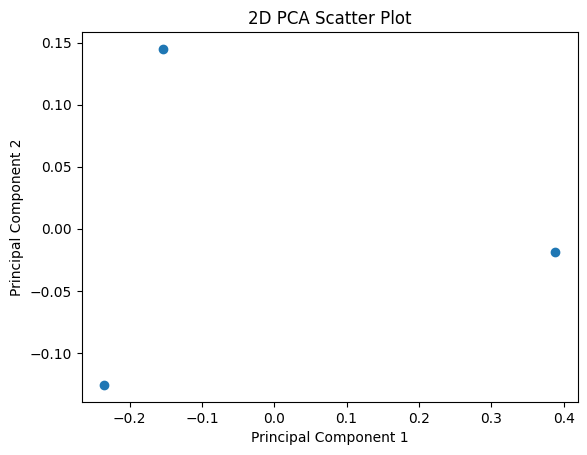

In [ ]:
import matplotlib.pyplot as plt

# Assuming X_pca is your PCA-transformed data
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA Scatter Plot')
plt.show()


IndexError: index 2 is out of bounds for axis 1 with size 2

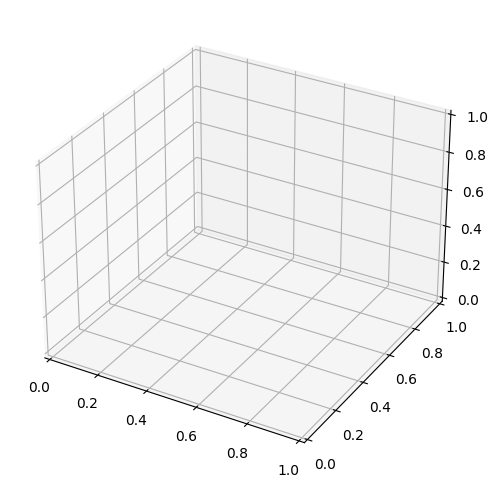

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Assuming X_pca is your PCA-transformed data
ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2])
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA Scatter Plot')

plt.show()


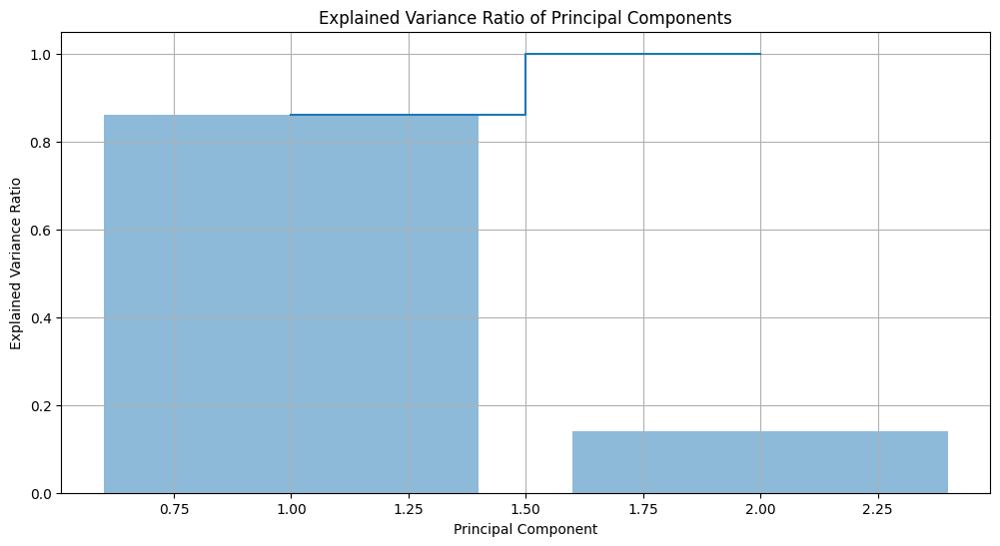

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming pca is your fitted PCA object
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, alpha=0.5, align='center')
plt.step(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio of Principal Components')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


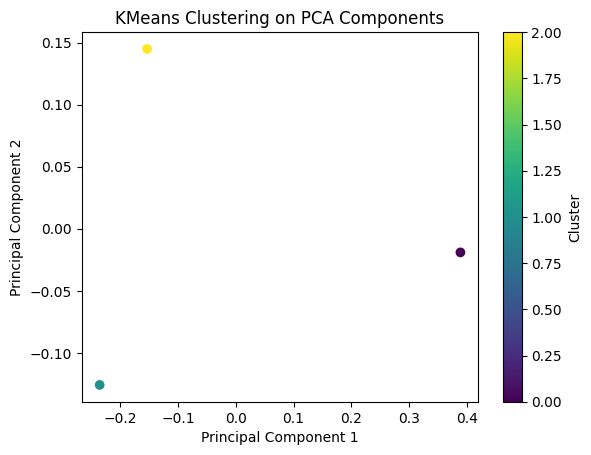

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Fit KMeans clustering on the first two principal components
kmeans = KMeans(n_clusters=3)  # You can choose the number of clusters based on your data
clusters = kmeans.fit_predict(X_pca[:, :2])

# Visualize the clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('KMeans Clustering on PCA Components')
plt.colorbar(label='Cluster')
plt.show()


In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Fit t-SNE on the first two principal components
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca[:, :3])  # Using first 30 PCs for t-SNE

# Visualize t-SNE
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization of PCA Components')
plt.show()


ValueError: perplexity must be less than n_samples

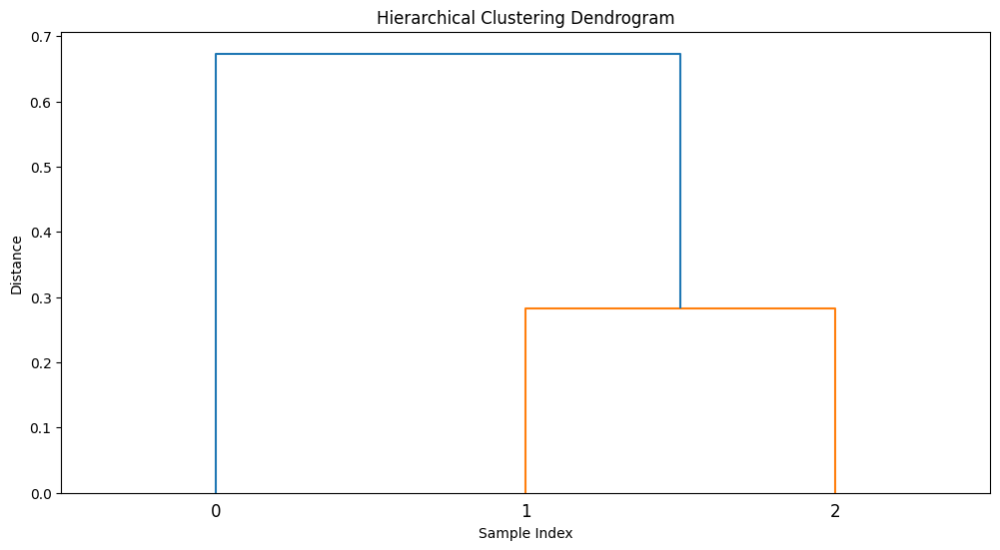

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Compute the linkage matrix
Z = linkage(X_pca[:, :10], method='ward')  # Using first 10 PCs for hierarchical clustering

# Plot dendrogram
plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

# Define the autoencoder model
input_dim = X_normalized.shape[1]  # Number of input features
encoding_dim = 32  # Size of encoded representation

input_layer = layers.Input(shape=(input_dim,))
encoded = layers.Dense(encoding_dim, activation='relu')(input_layer)
decoded = layers.Dense(input_dim, activation='sigmoid')(encoded)

autoencoder = tf.keras.Model(input_layer, decoded)

# Compile and train the autoencoder
autoencoder.compile(optimizer='adam', loss='mean_squared_error')
autoencoder.fit(X_normalized, X_normalized, epochs=50, batch_size=256, shuffle=True, validation_split=0.2)

# Get the encoded representation
encoder = tf.keras.Model(input_layer, encoded)
X_encoded = encoder.predict(X_normalized)

# Perform PCA on the encoded data
pca = PCA(n_components=3)
X_pca_encoded = pca.fit_transform(X_encoded)

# Visualize PCA of encoded data
plt.scatter(X_pca_encoded[:, 0], X_pca_encoded[:, 1])
plt.xlabel('PC1 (Encoded)')
plt.ylabel('PC2 (Encoded)')
plt.title('PCA of Encoded Data')
plt.show()


IndexError: tuple index out of range

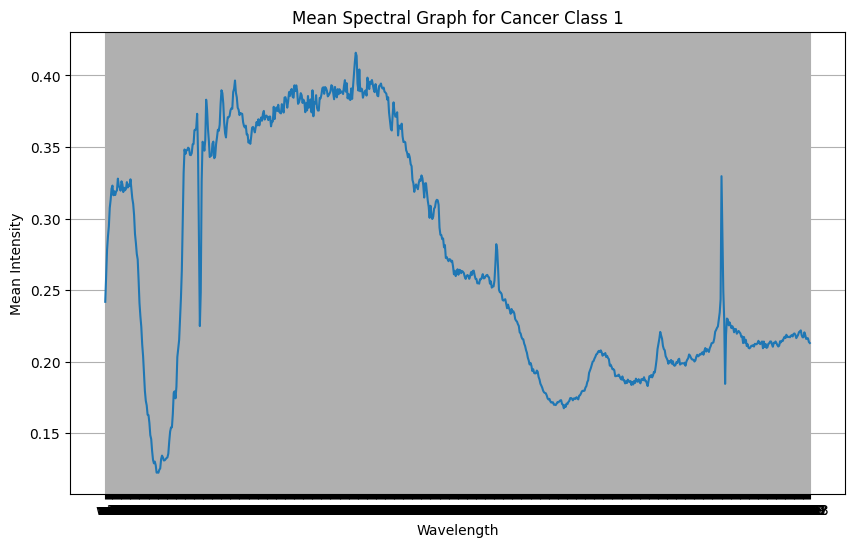

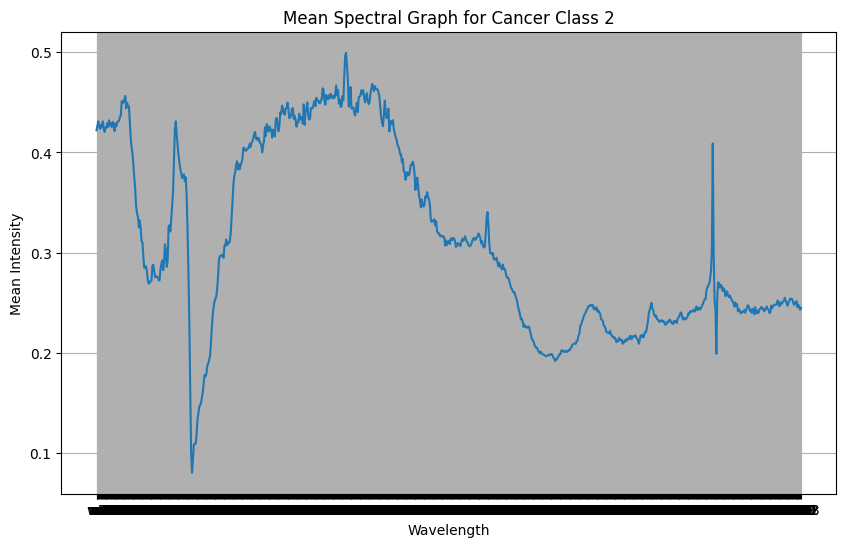

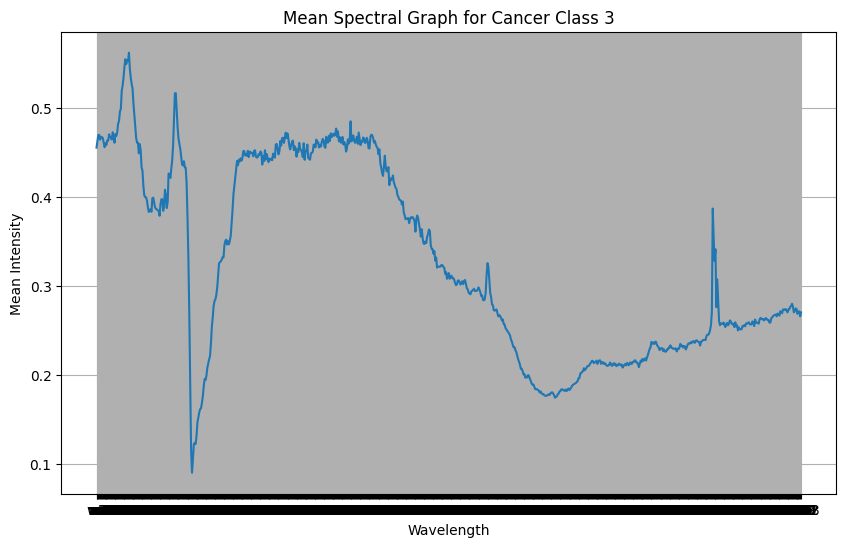

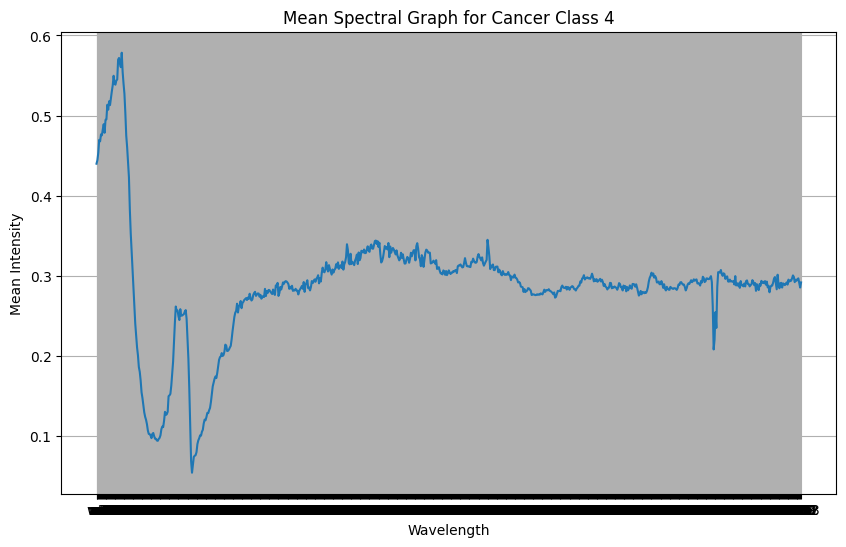

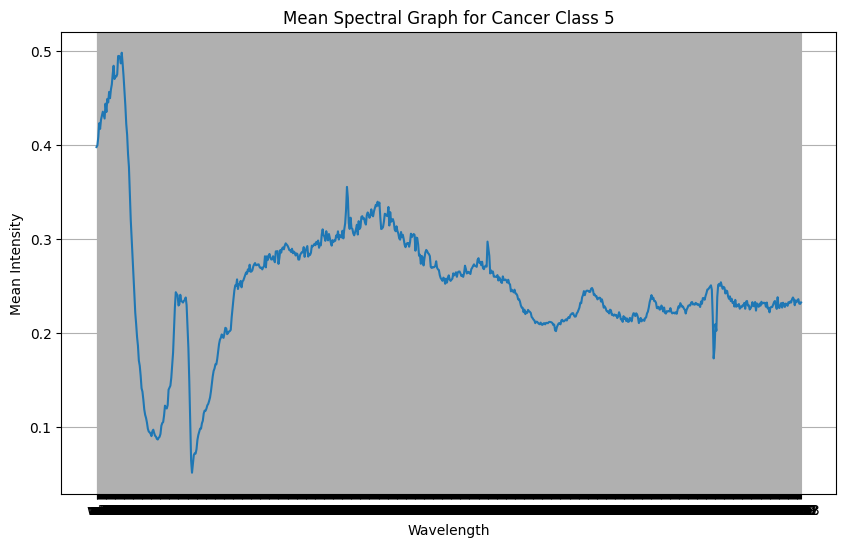

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract wavelengths and spectral data
    wavelengths = class_data.columns[1:]  #columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  #other columns are spectral data

    # Calculate mean spectrum
    mean_spectrum = spectra.mean(axis=0)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(wavelengths, mean_spectrum)
    plt.title(f'Mean Spectral Graph for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Mean Intensity')
    plt.grid(True)
    plt.show()


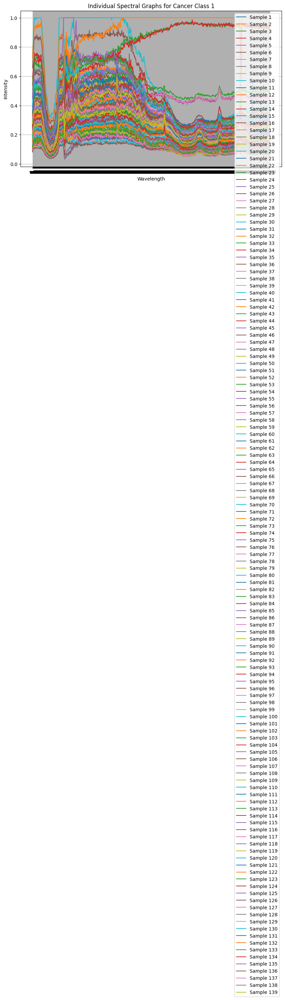

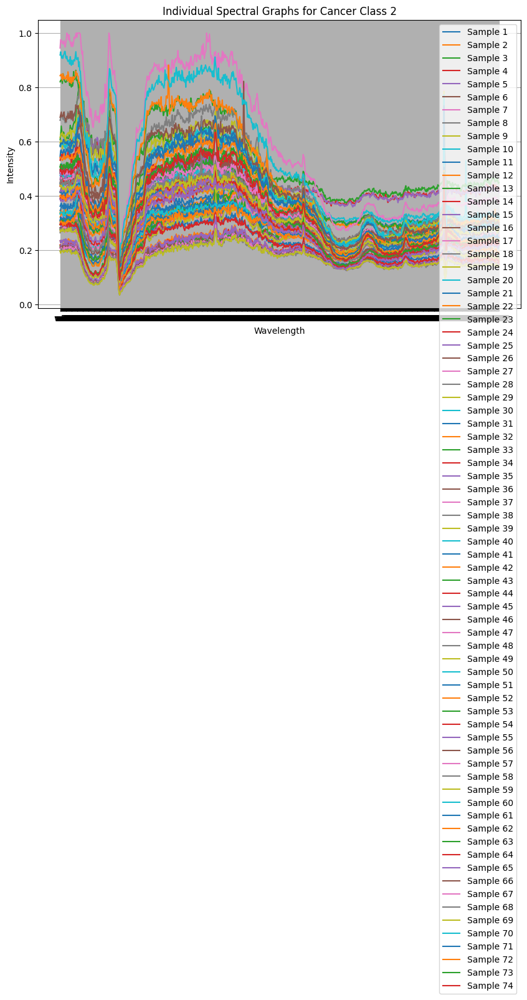

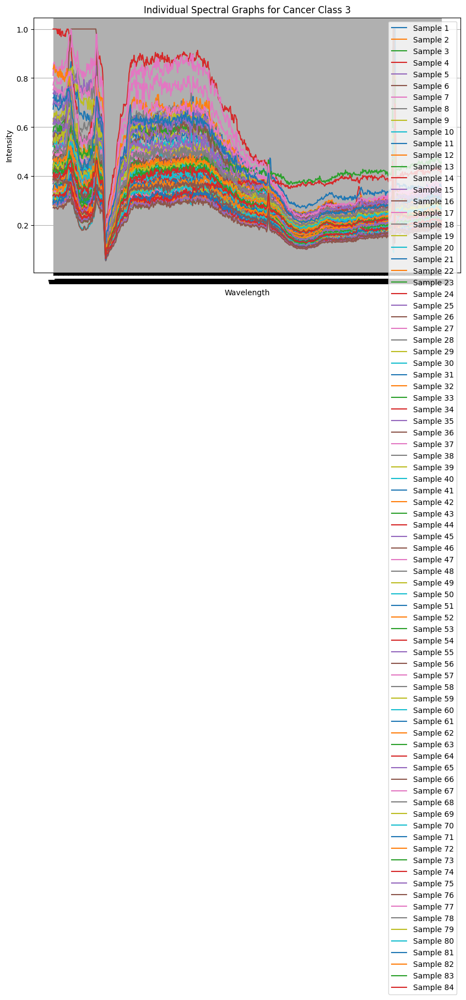

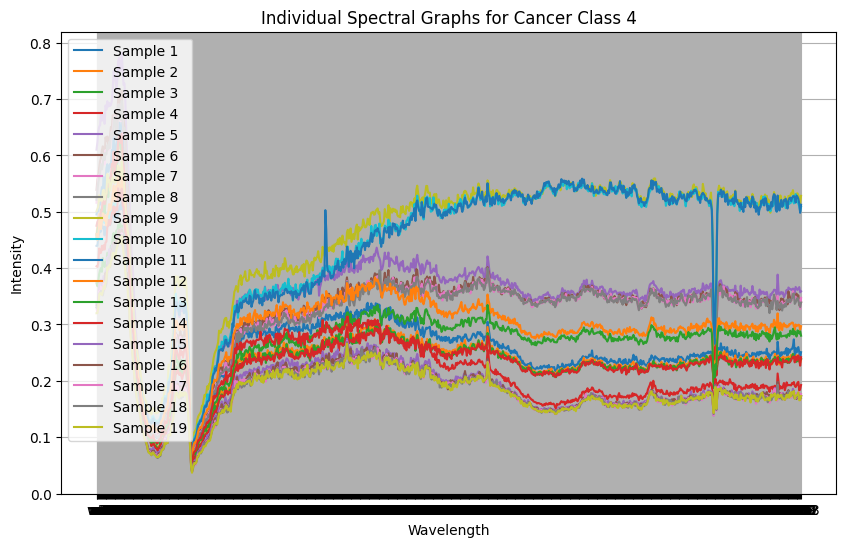

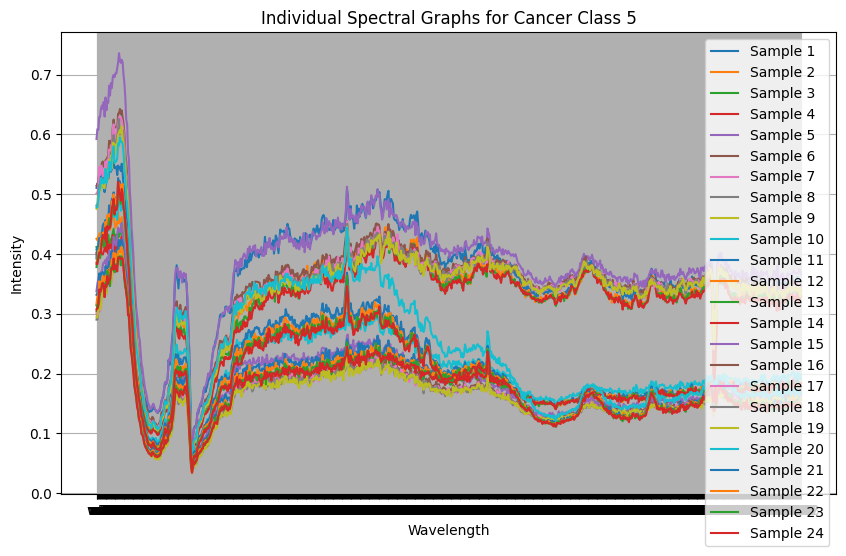

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract wavelengths and spectral data
    wavelengths = class_data.columns[1:]  # columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  # other columns are spectral data

    # Plot individual spectral graphs
    plt.figure(figsize=(10, 6))
    for i in range(len(spectra)):
        plt.plot(wavelengths, spectra.iloc[i], label=f'Sample {i+1}')

    plt.title(f'Individual Spectral Graphs for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.legend()
    plt.grid(True)
    plt.show()


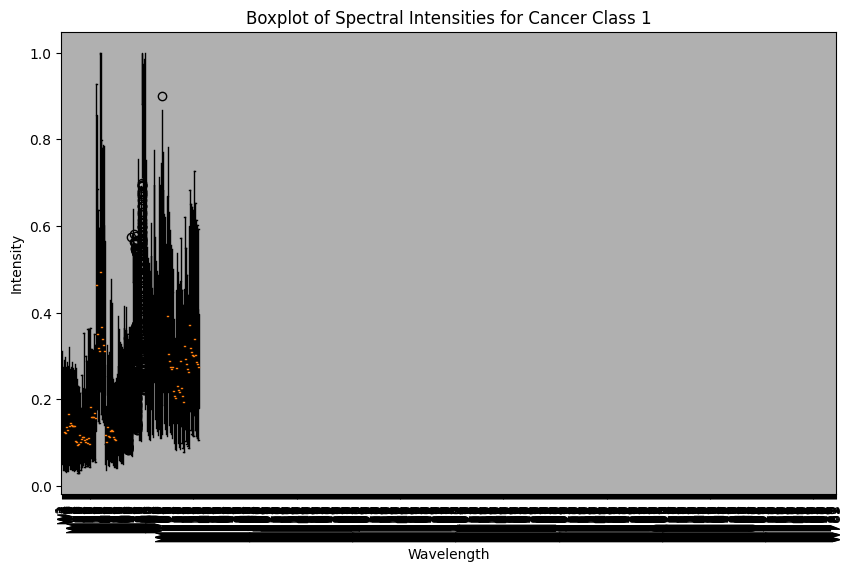

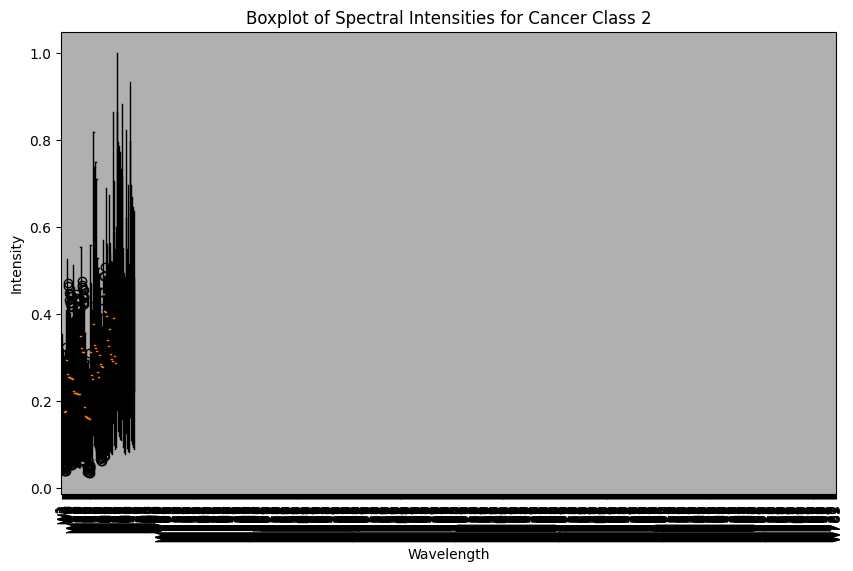

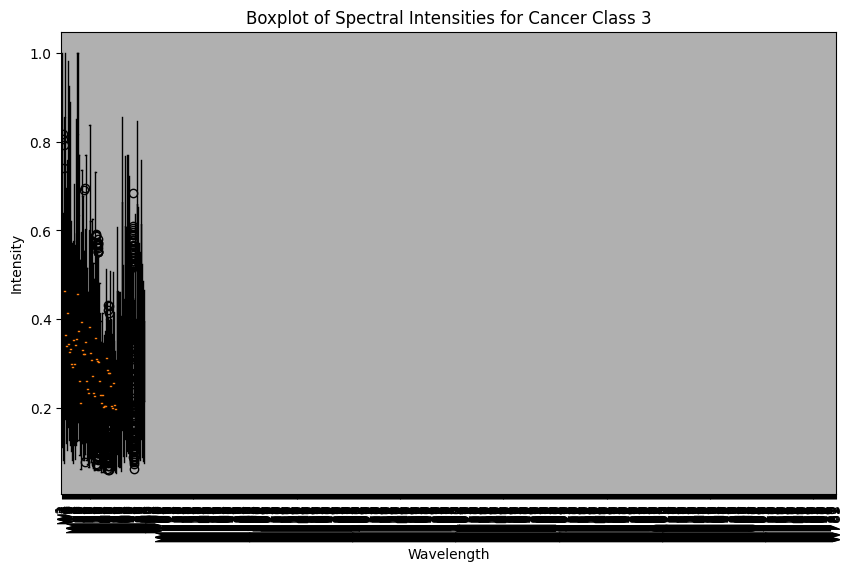

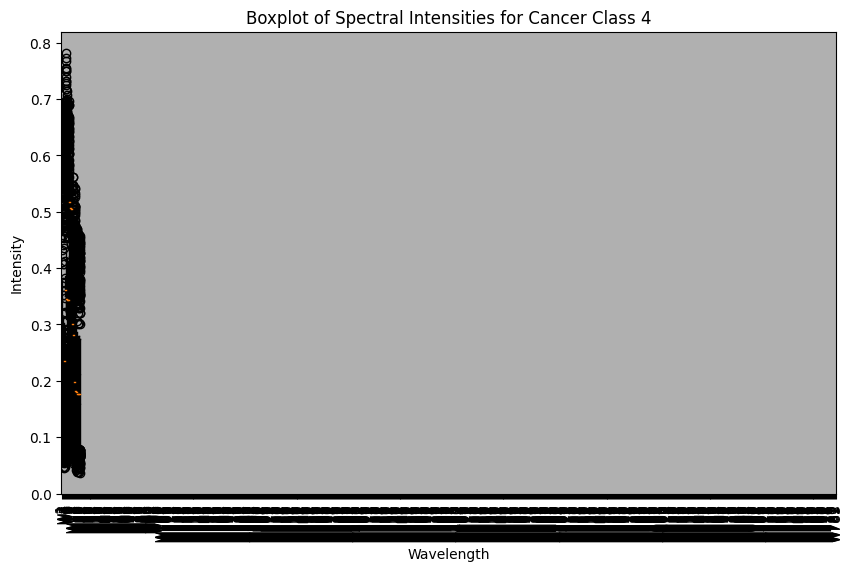

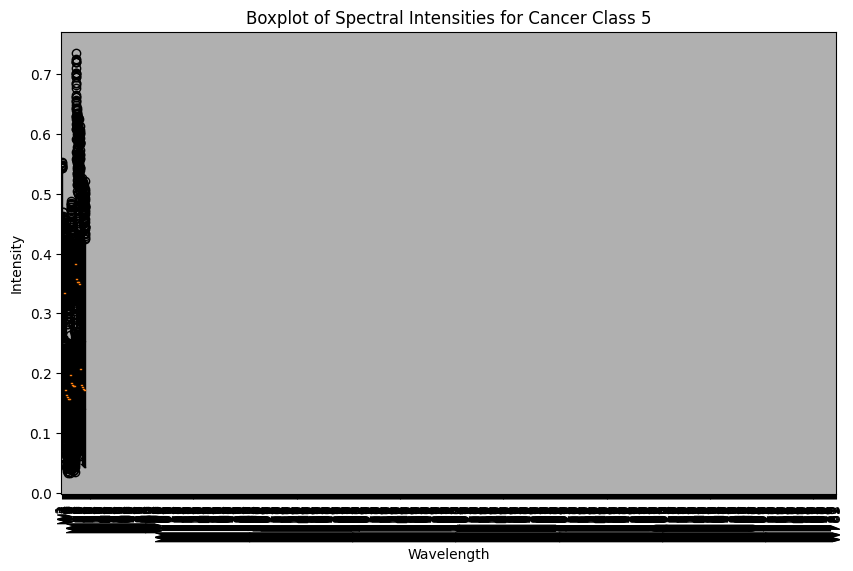

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract spectral data
    spectra = class_data.drop(['SAMPLES'], axis=1)  # Assuming other columns are spectral data

    # Plot boxplot
    plt.figure(figsize=(10, 6))
    plt.boxplot(spectra.T)  # Transpose spectra DataFrame
    plt.title(f'Boxplot of Spectral Intensities for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.xticks(range(1, len(wavelengths) + 1), wavelengths, rotation=90)
    plt.grid(True)
    plt.show()

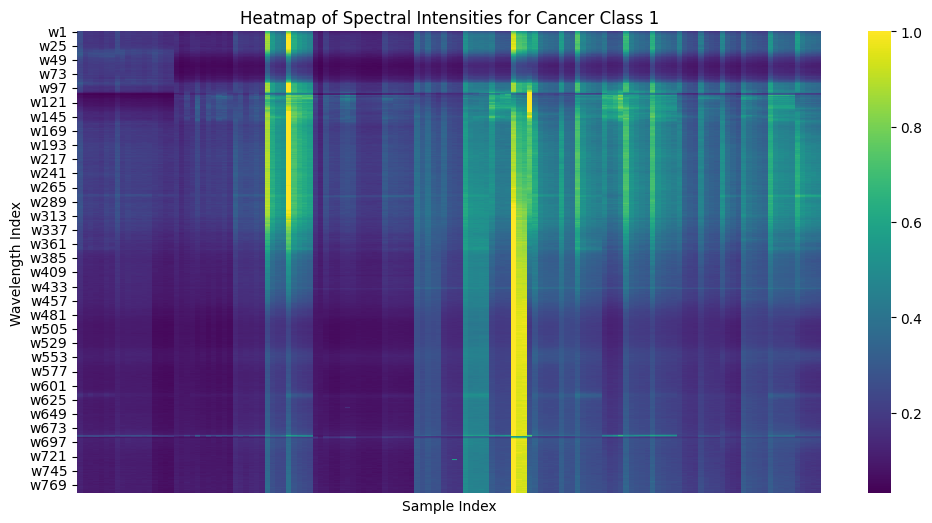

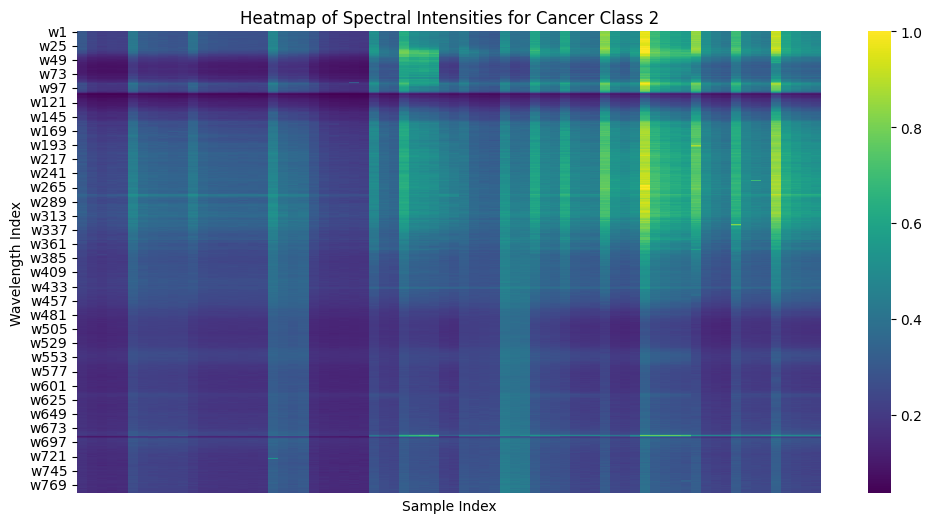

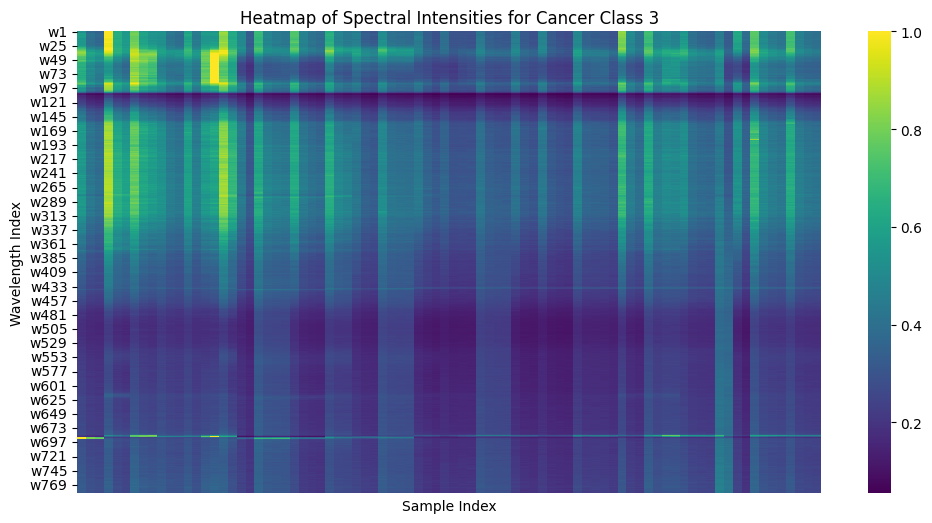

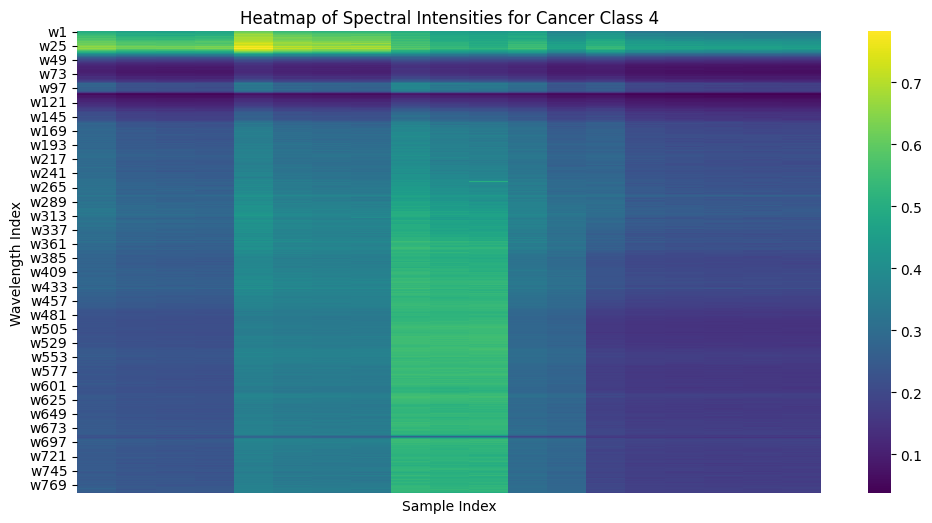

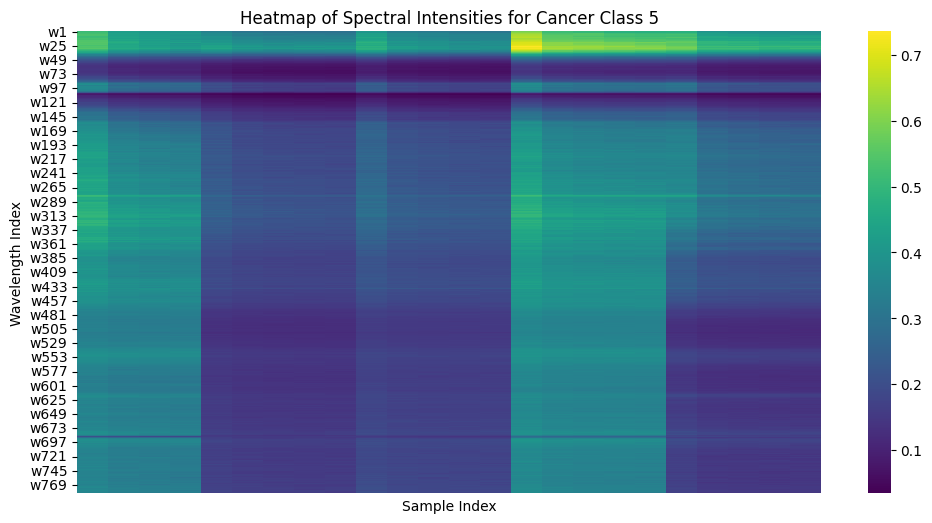

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract wavelengths and spectral data
    wavelengths = class_data.columns[1:]  # columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  # columns are spectral data

    # Plot heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(spectra.T, cmap='viridis', xticklabels=False)
    plt.title(f'Heatmap of Spectral Intensities for Cancer Class {cancer_class}')
    plt.xlabel('Sample Index')
    plt.ylabel('Wavelength Index')
    plt.show()


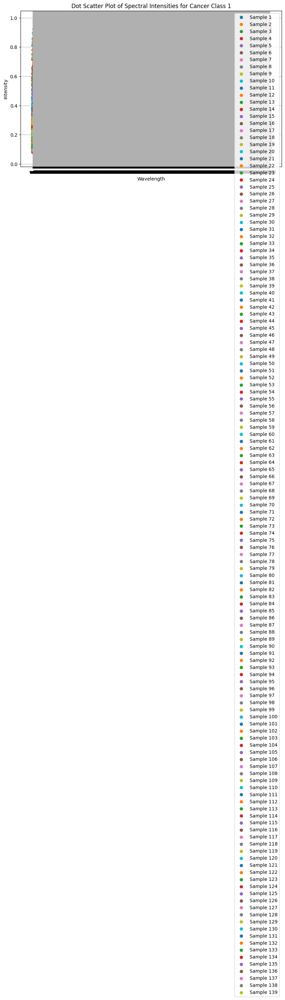

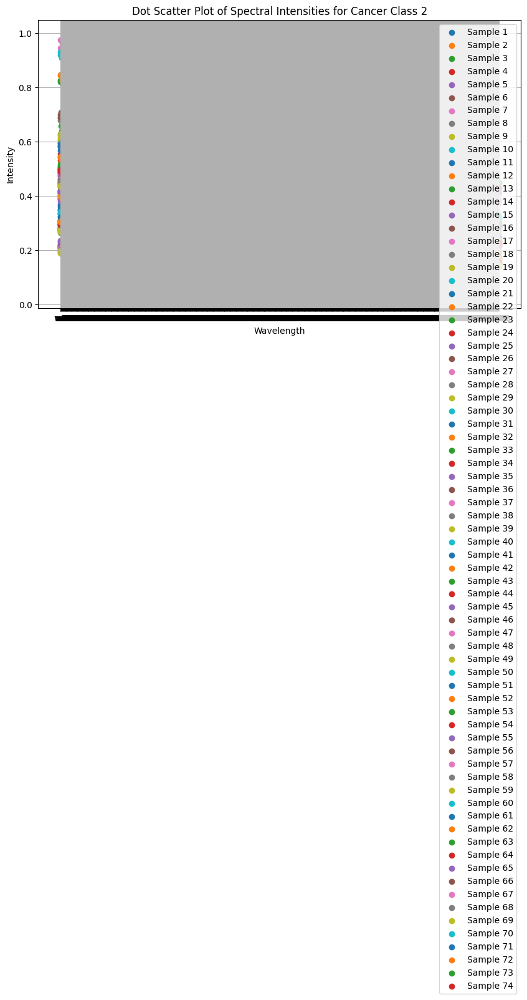

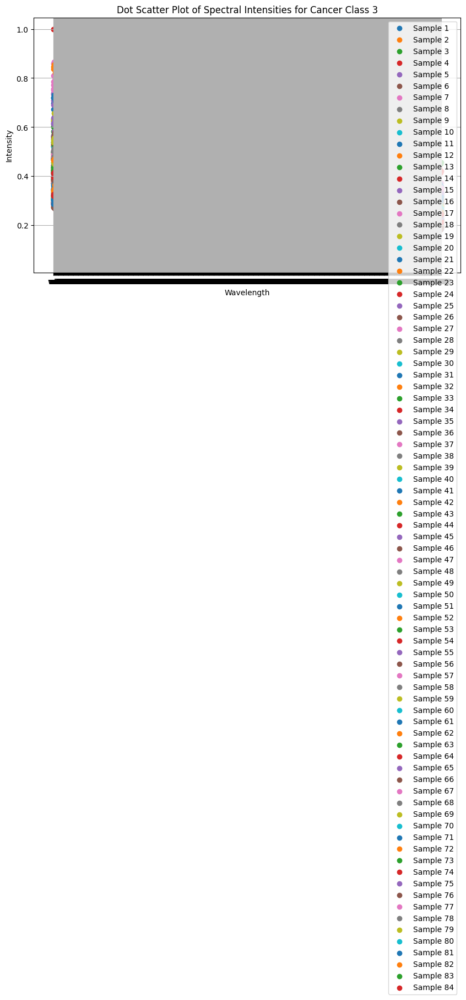

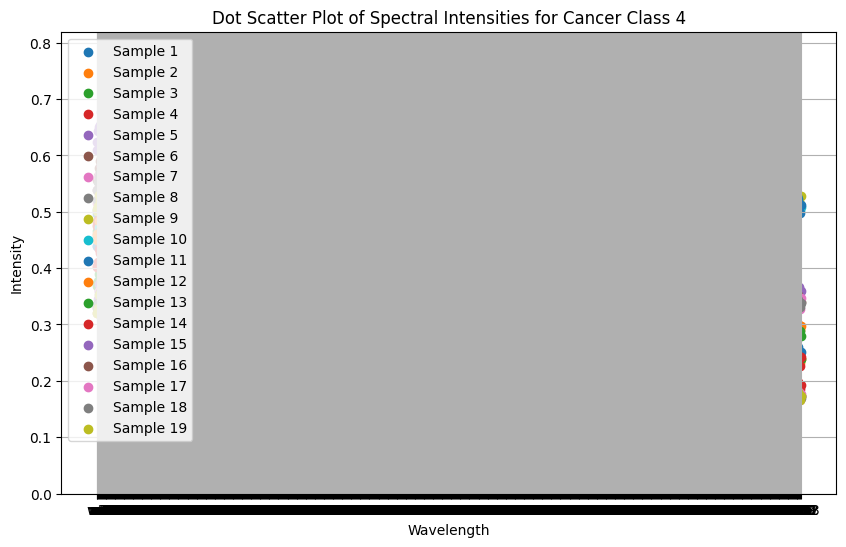

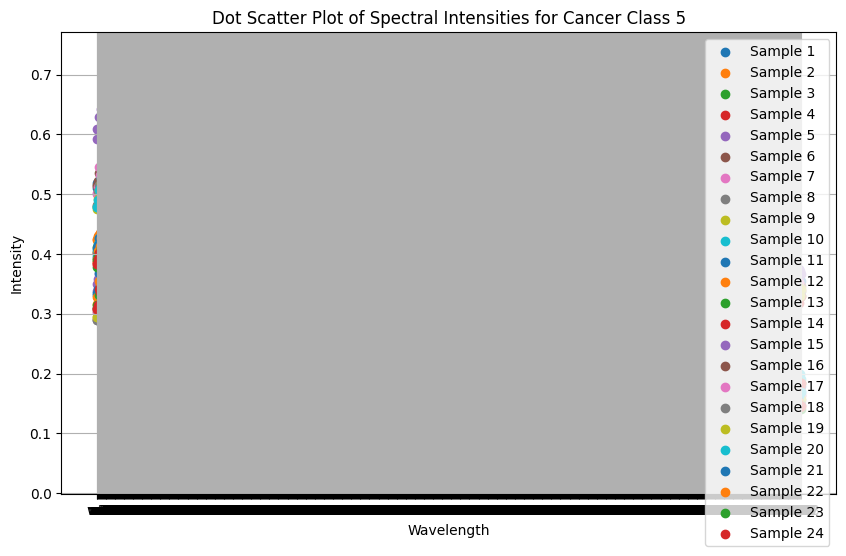

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract wavelengths and spectral data
    wavelengths = class_data.columns[1:]  # columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  #other columns are spectral data

    # Plot dot scatter plot
    plt.figure(figsize=(10, 6))
    for i in range(len(spectra)):
        plt.scatter(wavelengths, spectra.iloc[i], label=f'Sample {i+1}')

    plt.title(f'Dot Scatter Plot of Spectral Intensities for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.legend()
    plt.grid(True)
    plt.show()

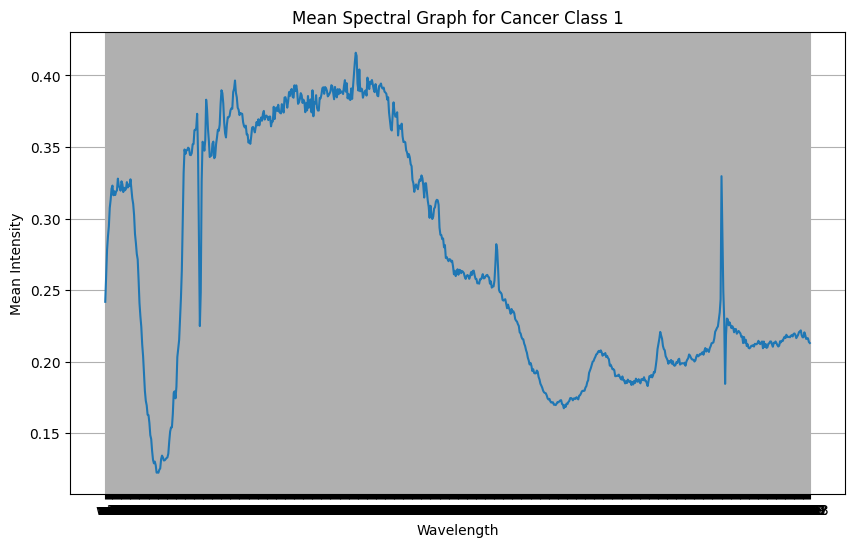

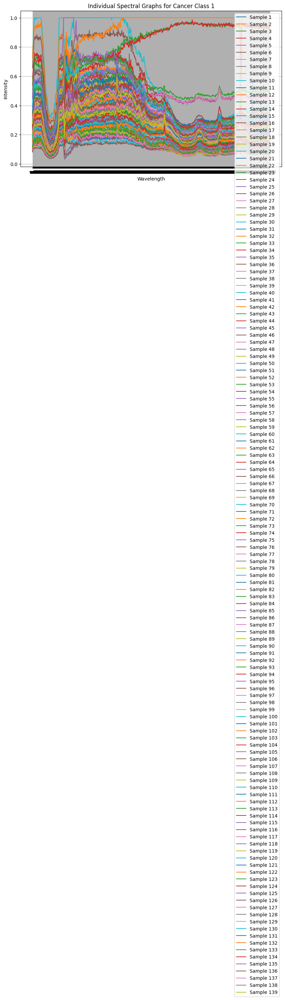

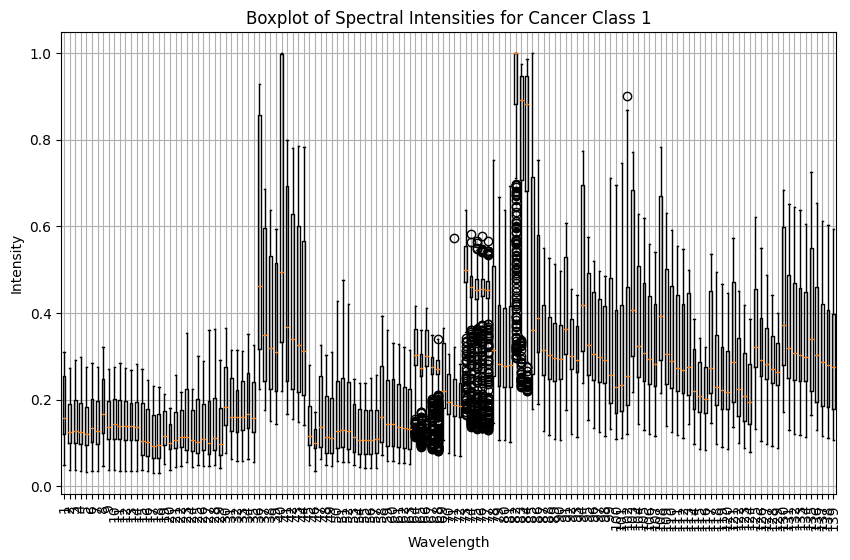

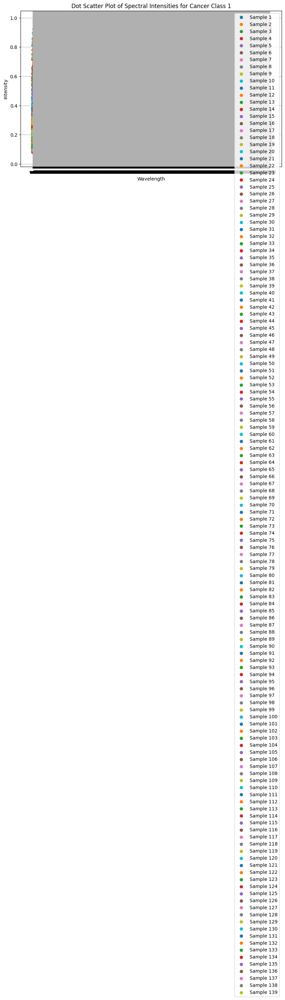

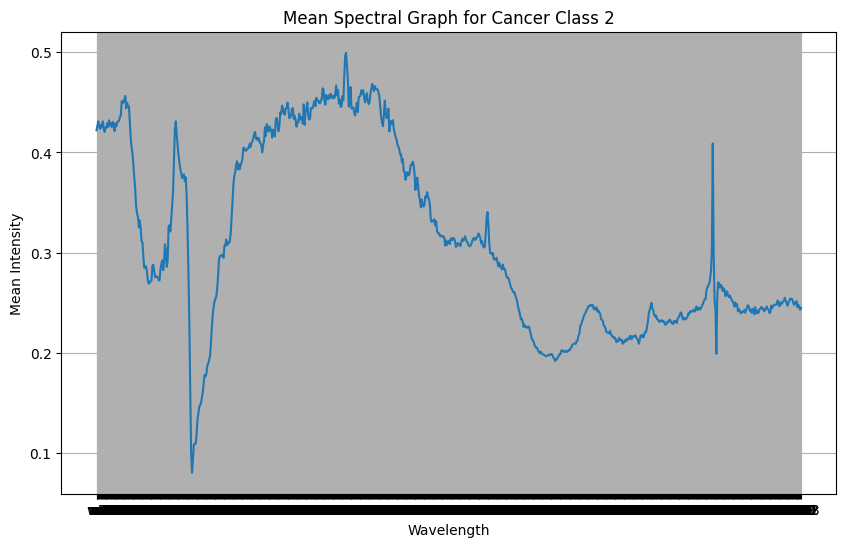

...

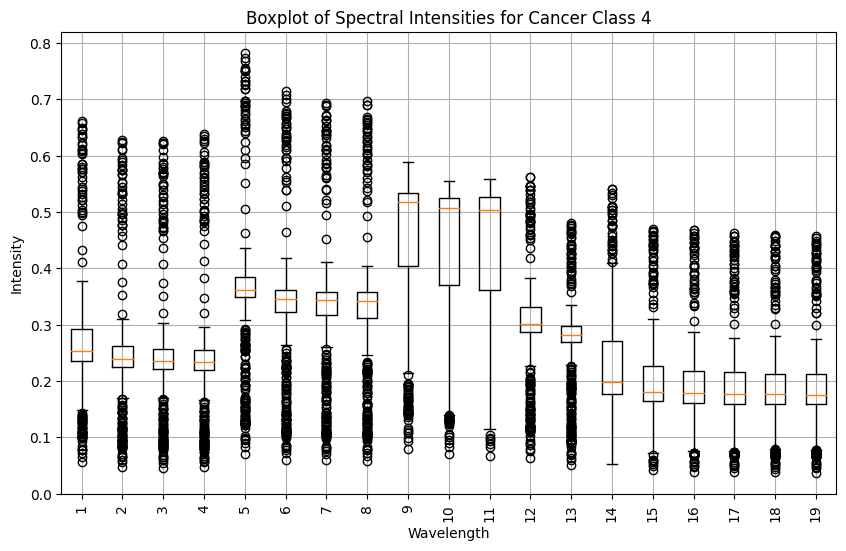

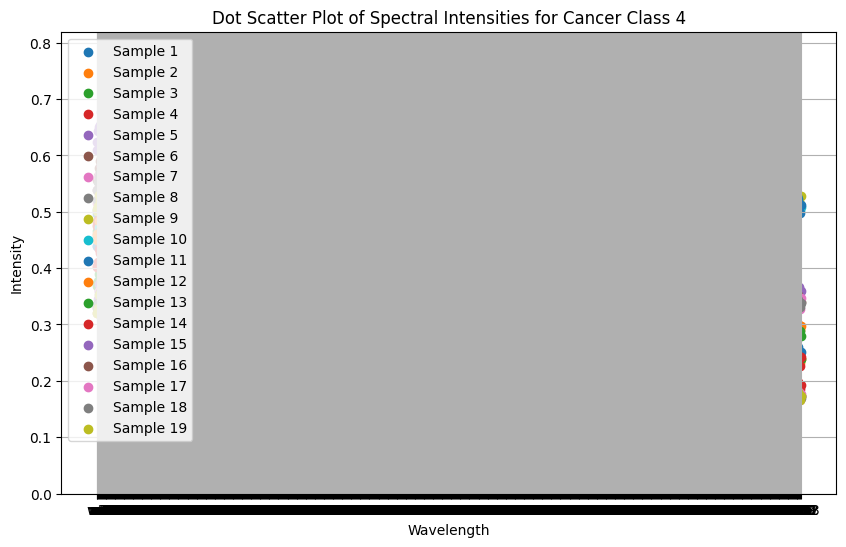

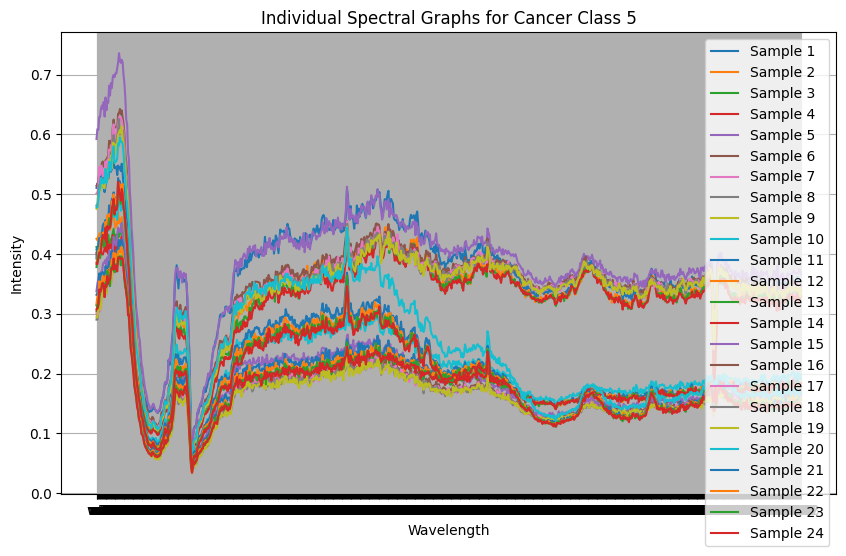

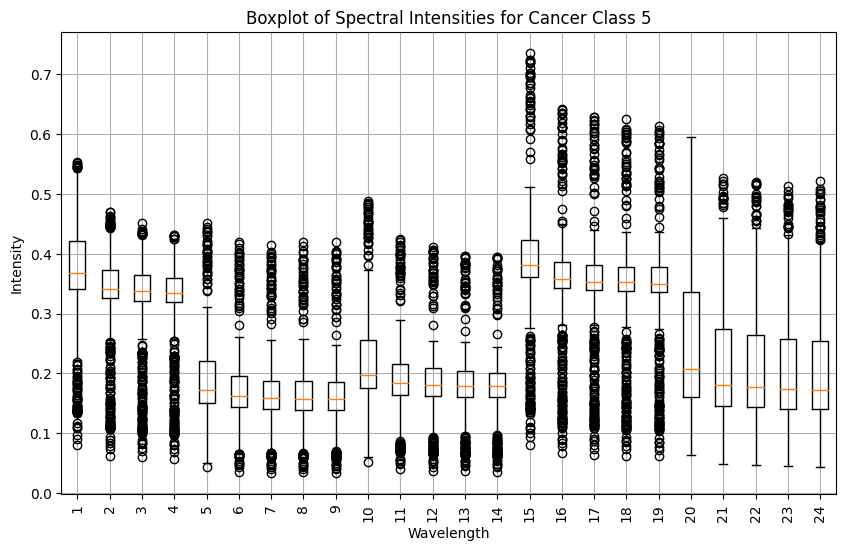

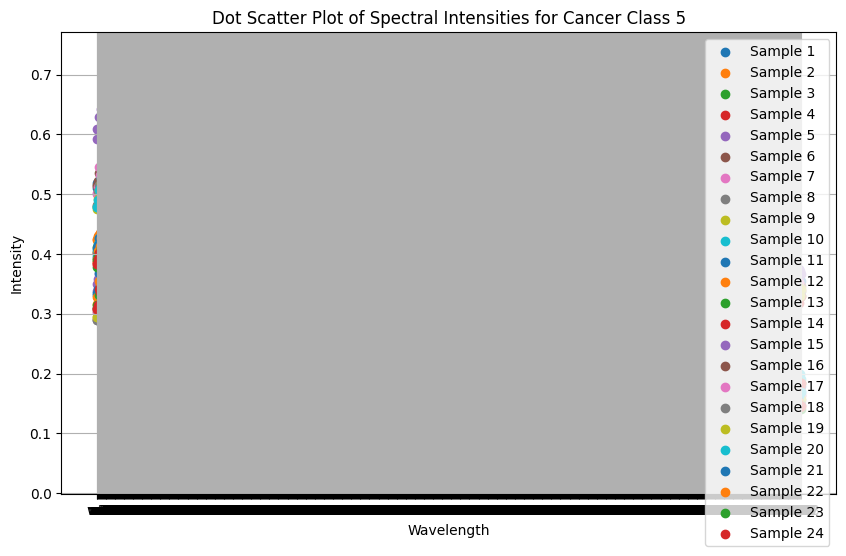

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract wavelengths and spectral data
    wavelengths = class_data.columns[1:]  # columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  # other columns are spectral data

    # Mean Spectral Graph
    plt.figure(figsize=(10, 6))
    mean_spectrum = spectra.mean(axis=0)
    plt.plot(wavelengths, mean_spectrum)
    plt.title(f'Mean Spectral Graph for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Mean Intensity')
    plt.grid(True)
    plt.show()

    # Individual Spectral Graphs
    plt.figure(figsize=(10, 6))
    for i in range(len(spectra)):
        plt.plot(wavelengths, spectra.iloc[i], label=f'Sample {i+1}')

    plt.title(f'Individual Spectral Graphs for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Boxplot
    plt.figure(figsize=(10, 6))
    plt.boxplot(spectra.T)
    plt.title(f'Boxplot of Spectral Intensities for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

    # Dot Scatter Plot
    plt.figure(figsize=(10, 6))
    for i in range(len(spectra)):
        plt.scatter(wavelengths, spectra.iloc[i], label=f'Sample {i+1}')

    plt.title(f'Dot Scatter Plot of Spectral Intensities for Cancer Class {cancer_class}')
    plt.xlabel('Wavelength')
    plt.ylabel('Intensity')
    plt.legend()
    plt.grid(True)
    plt.show()


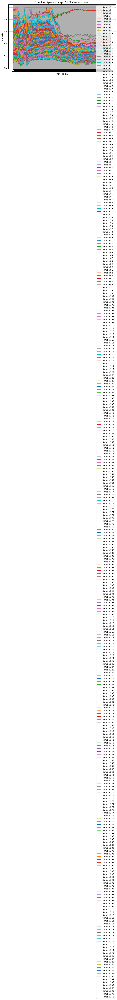

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

# Initialize lists to store concatenated spectral data and labels
concatenated_spectra = []
concatenated_labels = []

# Iterate over each cancer class
for cancer_class in cancer_classes:
    class_data = data[data['SAMPLES'] == cancer_class]

    # Extract spectral data and labels
    wavelengths = class_data.columns[1:]  # Assuming columns from w1 to w783
    spectra = class_data.drop(['SAMPLES'], axis=1)  # Assuming other columns are spectral data

    # Append spectral data and labels to the lists
    concatenated_spectra.append(spectra)
    concatenated_labels.extend([cancer_class] * len(spectra))

# Concatenate spectral data from all classes
all_spectra = pd.concat(concatenated_spectra, ignore_index=True)

# Plot combined spectral graph
plt.figure(figsize=(10, 6))
for i in range(len(all_spectra)):
    plt.plot(wavelengths, all_spectra.iloc[i], label=f'Sample {i+1}')

plt.title('Combined Spectral Graph for All Cancer Classes')
plt.xlabel('Wavelength')
plt.ylabel('Intensity')
plt.legend()
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


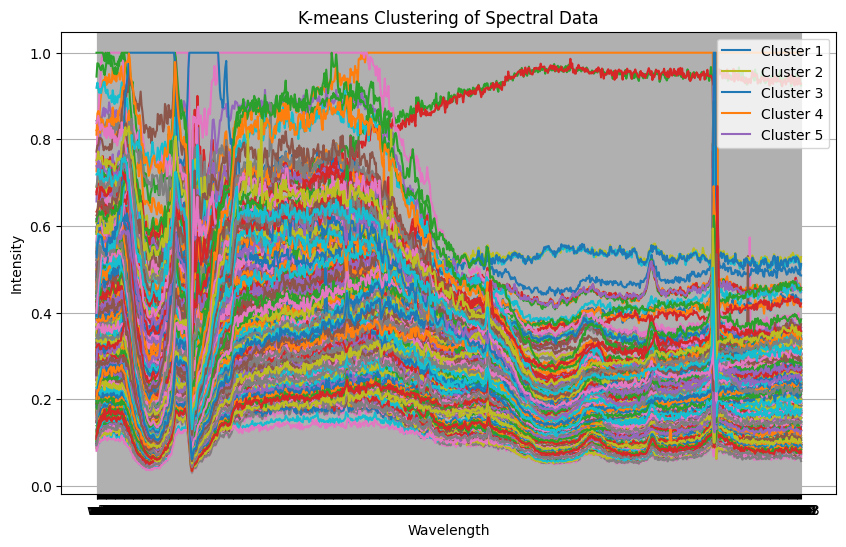

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

# Concatenate spectral data from all classes
all_spectra = pd.concat([data[data['SAMPLES'] == cancer_class].drop('SAMPLES', axis=1) for cancer_class in cancer_classes], ignore_index=True)

# Perform K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(all_spectra)

# Plot clusters
plt.figure(figsize=(10, 6))
for cluster_label in np.unique(clusters):
    cluster_samples = all_spectra[clusters == cluster_label]
    for i in range(len(cluster_samples)):
        plt.plot(cluster_samples.iloc[i], label=f'Cluster {cluster_label + 1}' if i == 0 else None)

plt.title('K-means Clustering of Spectral Data')
plt.xlabel('Wavelength')
plt.ylabel('Intensity')
plt.legend()
plt.grid(True)
plt.show()


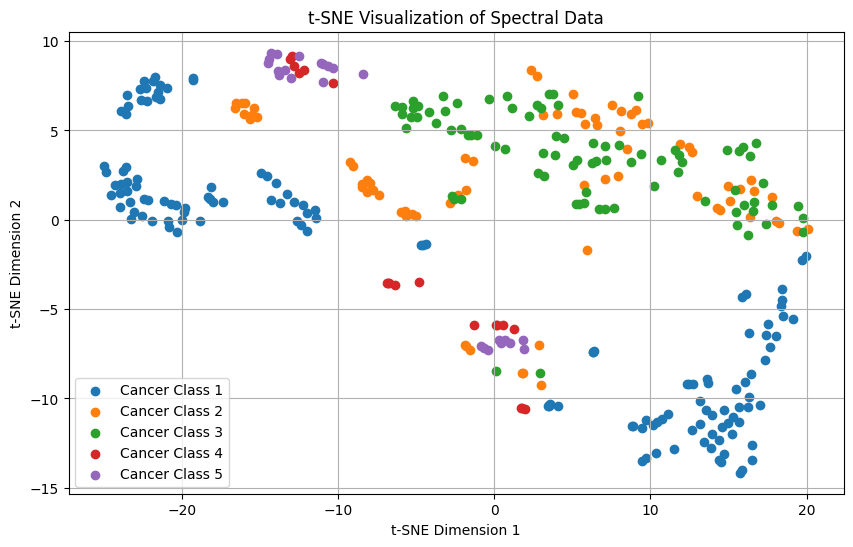

In [ ]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv("/content/cancer_data3.csv")

# Filter data by cancer types (classes)
cancer_classes = [1, 2, 3, 4, 5]

# Concatenate spectral data from all classes
all_spectra = pd.concat([data[data['SAMPLES'] == cancer_class].drop('SAMPLES', axis=1) for cancer_class in cancer_classes], ignore_index=True)

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
embedded_spectra = tsne.fit_transform(all_spectra)

# Plot t-SNE embedding
plt.figure(figsize=(10, 6))
for i, cancer_class in enumerate(cancer_classes):
    class_samples = embedded_spectra[data['SAMPLES'] == cancer_class]
    plt.scatter(class_samples[:, 0], class_samples[:, 1], label=f'Cancer Class {cancer_class}')

plt.title('t-SNE Visualization of Spectral Data')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.grid(True)
plt.show()